# Pet popularity contest

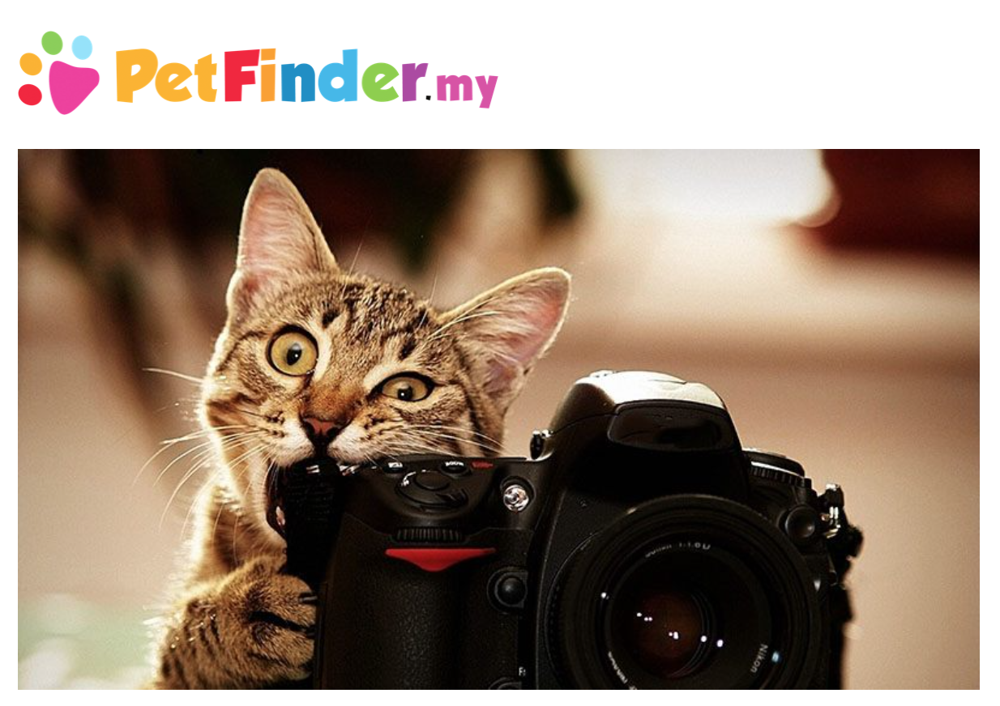

In this [kaggle competition](https://www.kaggle.com/c/petfinder-pawpularity-score/overview), we’ll analyze raw images and metadata to predict the “Pawpularity” of pet photos. 

In [1]:
from matplotlib.image import imread   #, imsave
from matplotlib import pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
import random
from sklearn.utils import shuffle
import math


import os
import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Input, AveragePooling2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.losses import BinaryCrossentropy, MeanAbsoluteError
from tensorflow.keras.utils import Sequence
import tensorflow.keras.preprocessing.image as keras_image

from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

In [2]:
def get_filenames(directory):
    """
    This function will generate the file names in a directory 
    tree by walking the tree either top-down or bottom-up. For each 
    directory in the tree rooted at directory top (including top itself), 
    it yields a 3-tuple (dirpath, dirnames, filenames).
    """
    file_names = []  # List which will store all of the full filepaths.

    # Walk the tree.
    for root, directories, files in os.walk(directory):
        for filename in files:
            # Join the two strings in order to form the full filepath.
            filepath = os.path.join(filename)     # just filename
            file_names.append(filepath)  # Add it to the list.

    return file_names  # Self-explanatory.

In [3]:
def image_process(image_origin):
    h = image_origin.shape[0]             # crop to min size from center
    w = image_origin.shape[1]
    if h < w:
        image_crop = image_origin[:, int((w-h)/2):int((w-h)/2)+h, :]
    elif h > w:
        image_crop = image_origin[int((h-w)/2):int((h-w)/2)+w, :, :]
    else:
        image_crop = image_origin
    image_resized = tf.image.resize(image_crop, size=(image_size, image_size), 
                                    method='bilinear', preserve_aspect_ratio=False, antialias=True)
    image_norm = image_resized   #/255.0    we use preprocess_input instead
    
    return image_norm

In [4]:
def image_augm(input_image, seed=0):      # custom image augmentation function
    if seed == 'random':
        seed = random.randint(0, 100)
    else:
        seed = seed  
    rotated_image = keras_image.random_rotation(input_image, rg=60, row_axis=0, col_axis=1, channel_axis=2)  
    zoom_image = tf.image.stateless_random_crop(rotated_image, size=(135, 135, 3), seed=[seed,seed])
    image_resized = tf.image.resize(zoom_image, size=(image_size, image_size), method='bilinear', 
                                    preserve_aspect_ratio=False, antialias=True)

    return image_resized     

In [5]:
def visualize(original, augmented):
    
    fig = plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.title('Original image')
    plt.imshow(original)

    plt.subplot(1,2,2)
    plt.title('Modificated image')
    plt.imshow(augmented)
    plt.show()

In [6]:
class DataSequence(Sequence):

    def __init__(self, x_set, y_set, batch_size, augm=True):
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size
        self.augm = augm

    def __len__(self):
        return math.ceil(len(self.x) / self.batch_size)

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
   
        if self.augm:
            return np.array([image_augm(image_process(imread(f'{train_dir}/{file_name}')), seed='random') for file_name in batch_x]), np.array(batch_y)   
        else:
            return np.array([image_process(imread(f'{train_dir}/{file_name}')) for file_name in batch_x]), np.array(batch_y)  
            

# 1. Data load and analysis

In [7]:
image_dir = 'petfinder-pawpularity-score/train'
files = get_filenames(f'{image_dir}')

In [8]:
df_train = pd.read_csv("petfinder-pawpularity-score/train.csv", index_col='Id')
print(df_train.shape)
df_train.head()

(9912, 13)


,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
Id,,,,,,,,,,,,,
0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,63
0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,42
0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,28
0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,15
001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,72


There are 9912 pet images. Also the optional Photo Metadata has included, with manual label each photo for key visual quality and composition parameters.

First, let's observe top 30 most popular and most unpopular pet images. 

In [9]:
paw_30 = df_train.sort_values(by='Pawpularity').tail(30).index
no_paw_30 = df_train.sort_values(by='Pawpularity').head(30).index

% of Pawpulality about  100


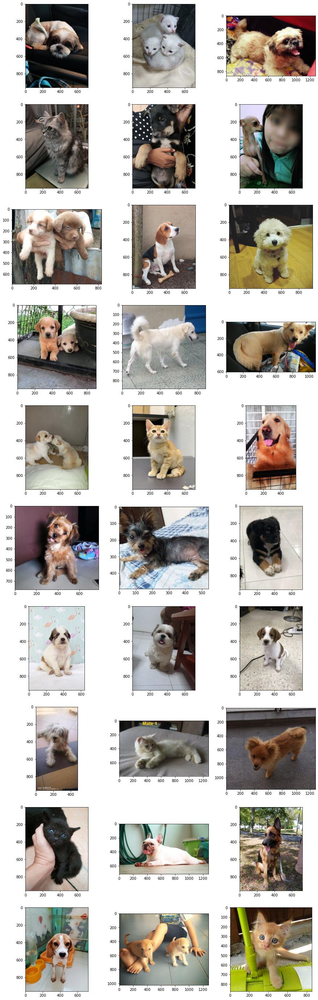

In [10]:
# Top popular
print('% of Pawpulality about ', df_train.sort_values(by='Pawpularity').tail(30)['Pawpularity'].min())

fig = plt.figure(figsize=(15,50))
for i, image in enumerate(paw_30):
    plt.subplot(10,3,i+1)
    plt.imshow(imread(f'{image_dir}/{image}.jpg'))
plt.show()

% of Pawpulality about  2


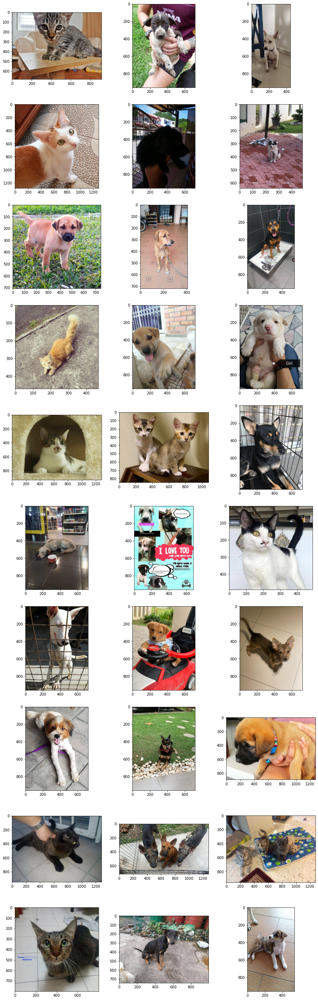

In [11]:
# Top unpopular
print('% of Pawpulality about ', df_train.sort_values(by='Pawpularity').head(30)['Pawpularity'].max())
fig = plt.figure(figsize=(15,50))
for i, image in enumerate(no_paw_30):
    plt.subplot(10,3,i+1)
    plt.imshow(imread(f'{image_dir}/{image}.jpg'))
plt.show()

With the naked eye it is hard to see some important difference between both groups. Let's try to use the metadata to find if there are some correlations.

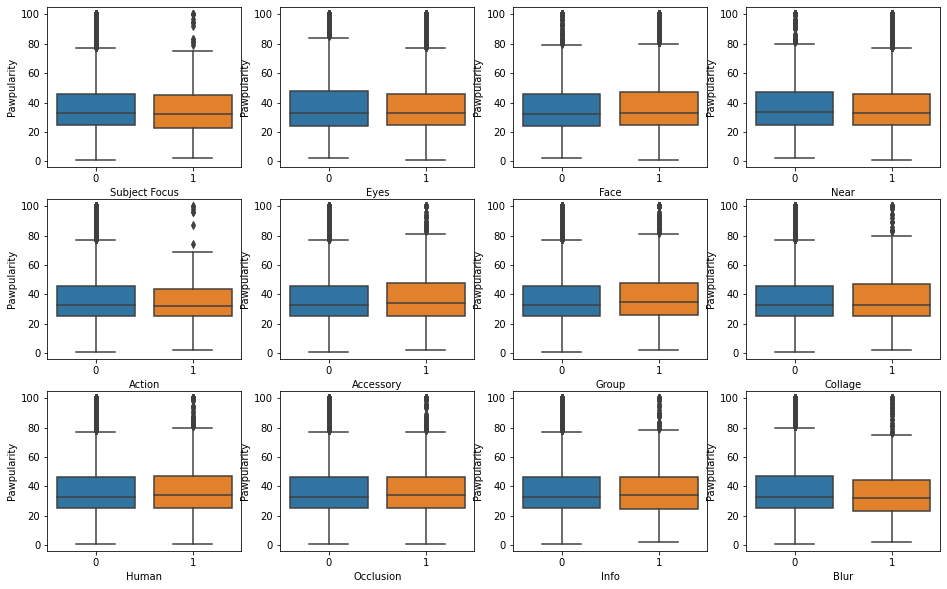

In [12]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16, 10))
for idx, feature in enumerate(df_train.columns[:-1]):
    sns.boxplot(x=df_train[feature], y=df_train['Pawpularity'], ax=axes[idx//4, idx%4]);

The metadata doesn't seem useful for predictions. We'll not use it.

# 2. Image preprocessing for CNN

Before training any of CNN models, the image dataset needs to be prepared. As we will use transfer learning, the input image shape should be the same as in previosly model fitted. Most CNN were fitted on the *imagenet* dataset with 224x224 size of RGB images. Our dataset consists of images with different sizes and ratios. So, first we will crop images by the shorter side to get a square form and reshape it after. We will also use image augmentation for training data using custom function.

In [13]:
image_size=224

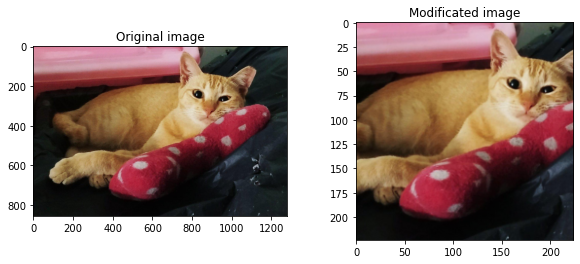

In [14]:
origin_image = imread(f'{image_dir}/{files[0]}')
modif_image = image_process(origin_image)
visualize(origin_image, modif_image/255.)

There are different ways of image augmentation based in the original:
- rotation,
- zoom,
- random hue change, 
- random saturation change,
- random brightness change, etc.

[Here](https://www.petfinder.my/cutenessmeter) we have some 
**Tips For Great Pet Photos:**

**Take clear, sharp photos. Not dim or blur ones. Use a DSLR / professional camera if available.**

**Use good lighting or natural ambience. Enhance the photo's brightness and contrast if necessary.**

**Take photos with the pet in action, i.e. smiling, jumping, or playing.**

**Prioritize cute, close-up photos especially for the profile picture, instead of using collages with many small photos.**

In this kind of problem, using of some color changing could be not a good idea, so only random rotation and random zoom about 60% of preprocessed image size was used for image augmentation.

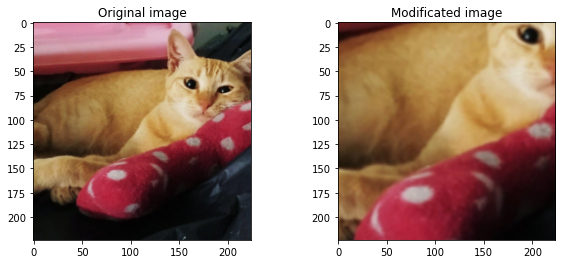

In [17]:
modif_image = image_augm(image_process(origin_image), seed='random')
visualize(image_process(origin_image)/255., modif_image/255.)

# 3. Model fitting

## 3.1. Split data 

In [18]:
# sort images and corresponded labels

files.sort()
df_train['Pawpularity'] = df_train['Pawpularity']/100
df_train = df_train.sort_index()
labels = df_train['Pawpularity']
del df_train

In [19]:
# split dataset to train, test and vallidation

files, labels = shuffle(files, labels, random_state=0)

test_ind = int(len(files)*0.85)   # 15% for test
val_ind = int(len(files)*0.7)     # 15% for validation, 70% for train

train_files, train_labels = files[:val_ind], labels[:val_ind]
val_files, val_labels = files[val_ind:test_ind], labels[val_ind:test_ind]
test_files, test_labels = files[test_ind:], labels[test_ind:]

del files, labels
print(f'train images: {len(train_files)} \nvalidation images: {len(val_files)} \ntest images: {len(test_files)}')

train images: 6938 
validation images: 1487 
test images: 1487


After a lot of hours of experimentation with CNN models such as VGG-16, GoogleNet Inception v1, ResNet-50, the ResNet-50 was chosen.

## 3.2. The typical transfer-learning 

First, we download the model with already trained weights but without top layer that we will customize according to the output labels for our problem.
Then, the layers of base model will be frozen and new layers will be added.
Finally, the model will be compiled and only new layers will be trained.

In [20]:
base_model = tf.keras.applications.resnet50.ResNet50(input_shape=(image_size, image_size, 3),
                                               include_top=False,
                                               weights='imagenet')
preprocess_input = tf.keras.applications.resnet50.preprocess_input

In [21]:
BC = BinaryCrossentropy()

# freeze previos layers
base_model.trainable = False
model = base_model

input_im = Input(shape=(image_size, image_size, 3)) 
x = preprocess_input(input_im)
x = base_model(x, training=False)   

# ends with average pooling and dense connection
x = AveragePooling2D((2, 2), padding='same')(x)
x = Flatten()(x)
x = Dense(1, activation='sigmoid')(x) 

# define the model 
model = Model(inputs=input_im, outputs=x)
model.compile(optimizer='adam', loss = BC, metrics=['mae']) 

In [22]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
average_pooling2d (AveragePo (None, 4, 4, 2048)        0         
_________________________________________________________________
flatten (Flatten)            (None, 32768)             0         
_________________________________________________________________
dense (Dense)                (None, 1)                 32769 

We can observe there are only 32,769 parameters of new top layers will be trained, while 23,587,712 parameters are constants.
The batch_size=200 was experimentally chosen and epochs=6 was the number of epochs before overfitting started.

In [23]:
history = model.fit(DataSequence(train_files, train_labels, batch_size=200, augm=True), 
                    validation_data = DataSequence(val_files, val_labels, batch_size=100, augm=False), 
                    epochs=7, verbose=1)

In [25]:
# Learning curve
fig, ax = plt.subplots(figsize=(16, 4))

plt.subplot(1, 2, 1)
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(train_loss, color='r', alpha=0.7, label='train_loss')
plt.plot(val_loss, color='b', alpha=0.5, label='val_loss')
plt.xlabel('epoch')
plt.legend()

plt.subplot(1, 2, 2)
train_mae = history.history['mae']
val_mae = history.history['val_mae']
plt.plot(train_mae, color='r', alpha=0.7, label='train_mae')
plt.plot(val_mae, color='b', alpha=0.5, label='val_mae')
plt.xlabel('epoch')
plt.legend()
plt.show()

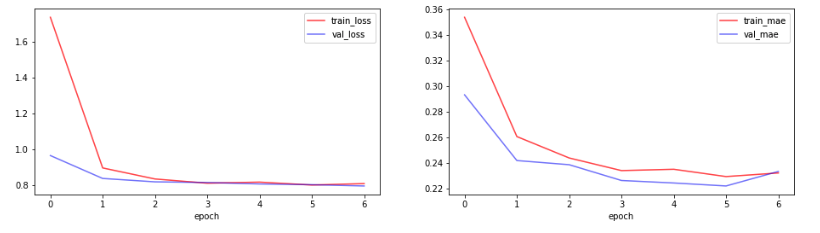

In [26]:
MAE = MeanAbsoluteError()

In [27]:
# predictions for test data
pred_labels = []
for file_name in test_files:
    y_pred = model.predict(np.array(image_process(imread(f'{image_dir}/{file_name}'))).reshape((1, 224, 224, 3)))
    pred_labels.append(y_pred[0][0]) 
    
# predictions for train data
pred_train_labels = []
for file_name in train_files:
    y_pred = model.predict(np.array(image_process(imread(f'{image_dir }/{file_name}'))).reshape((1, 224, 224, 3)))
    pred_train_labels.append(y_pred[0][0])

In [29]:
print(f'Mean Absolute Error train: {MAE(pred_train_labels, train_labels)}')
print(f'Mean Absolute Error test: {MAE(pred_labels, test_labels)}')

Mean Absolute Error train: 0.2176586538553238
Mean Absolute Error test: 0.23201154172420502


## 3.3. Fine tunung

Once the model has converged on the new data, we can unfreeze all or part of the base model and retrain the whole model end-to-end with a very low learning rate.

This is an optional last step that can potentially give us incremental improvements. It could also potentially lead to quick overfitting -- keep that in mind.

In [30]:
# unfreeze all layers
model.trainable=True  

# use very low learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(1e-5), loss = BC, metrics=['mae'])

In [32]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
tf.__operators__.getitem (Sl (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
average_pooling2d (AveragePo (None, 4, 4, 2048)        0         
_________________________________________________________________
flatten (Flatten)            (None, 32768)             0         
_________________________________________________________________
dense (Dense)                (None, 1)                 32769 

The optimal number of epochs in this training was also 7 and batch_size was 100.

In [31]:
history = model.fit(DataSequence(train_files, train_labels, batch_size=100, augm=True), 
                    validation_data = DataSequence(val_files, val_labels, batch_size=100, augm=False), 
                    epochs=7, verbose=1)

In [34]:
# Learning curve
fig, ax = plt.subplots(figsize=(16, 4))

plt.subplot(1, 2, 1)
train_loss += history.history['loss']
val_loss += history.history['val_loss']
plt.plot(train_loss, color='r', alpha=0.7, label='train_loss')
plt.plot(val_loss, color='b', alpha=0.5, label='val_loss')
plt.xlabel('epoch')
plt.legend()

plt.subplot(1, 2, 2)
train_mae += history.history['mae']
val_mae += history.history['val_mae']
plt.plot(train_mae, color='r', alpha=0.7, label='train_mae')
plt.plot(val_mae, color='b', alpha=0.5, label='val_mae')
plt.xlabel('epoch')
plt.legend()
plt.show()

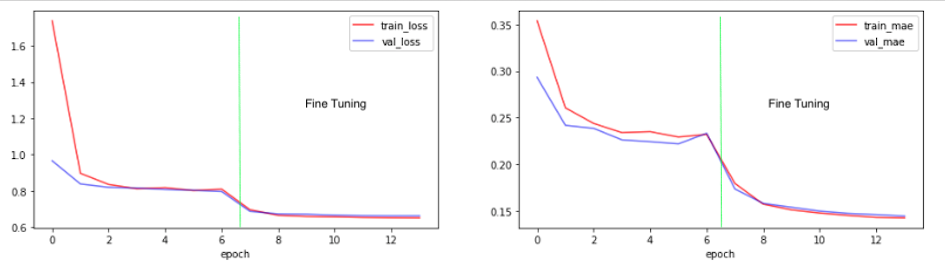

In [36]:
# predictions for test data
pred_labels = []
for file_name in test_files:
    y_pred = model.predict(np.array(image_process(imread(f'{image_dir}/{file_name}'))).reshape((1, 224, 224, 3)))
    pred_labels.append(y_pred[0][0]) 
    
# predictions for train data
pred_train_labels = []
for file_name in train_files:
    y_pred = model.predict(np.array(image_process(imread(f'{image_dir }/{file_name}'))).reshape((1, 224, 224, 3)))
    pred_train_labels.append(y_pred[0][0])

In [37]:
print(f'Mean Absolute Error train: {MAE(pred_train_labels, train_labels)}')
print(f'Mean Absolute Error test: {MAE(pred_labels, test_labels)}')

Mean Absolute Error train: 0.130962535738945
Mean Absolute Error test: 0.14274302124977112


# 4. Predictions on test data

Let's get some prediction on test data images:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


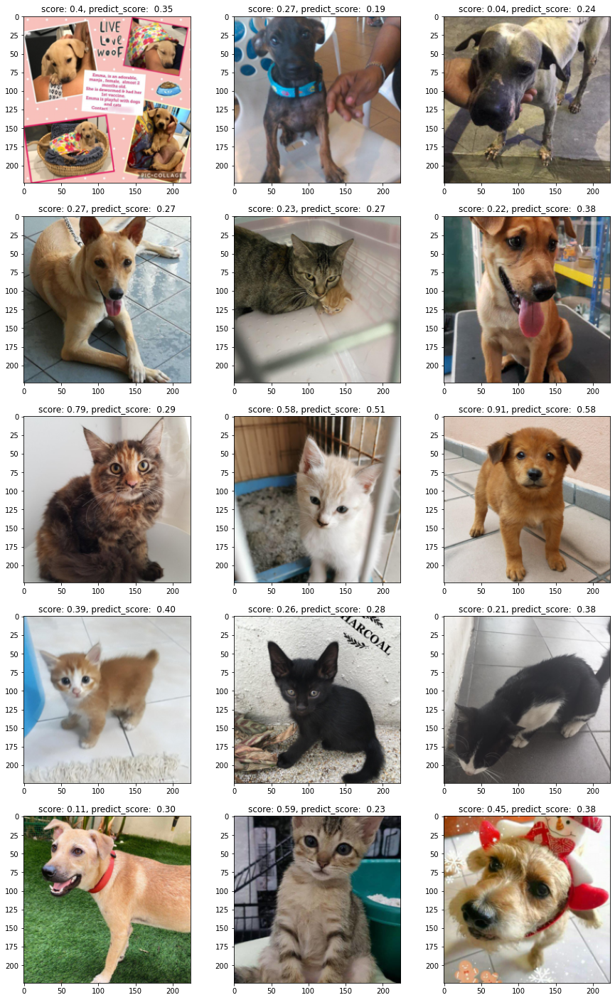

In [71]:
fig = plt.figure(figsize=(15,25))
for i, image in enumerate(test_files[:15]):
    plt.subplot(5,3,i+1)
    plt.imshow(image_process(imread(f'{image_dir}/{image}'))/255.)
    plt.title(f'score: {test_labels[i]}, predict_score:  {"{:.2f}".format(pred_labels[i])}')
plt.show()